`torch_dtype` is deprecated! Use `dtype` instead!


Using device: cuda:0
Step 1: Loading fine-tuned model from disk...


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Model loaded successfully.

Step 2: Preparing the test dataset...
Found 778 samples in the test set.

Step 3: Running inference to find and visualize blank ground truth cases...
Evaluating Test Set...

---> Found blank ground truth mask for test sample index: 2 (1/50)


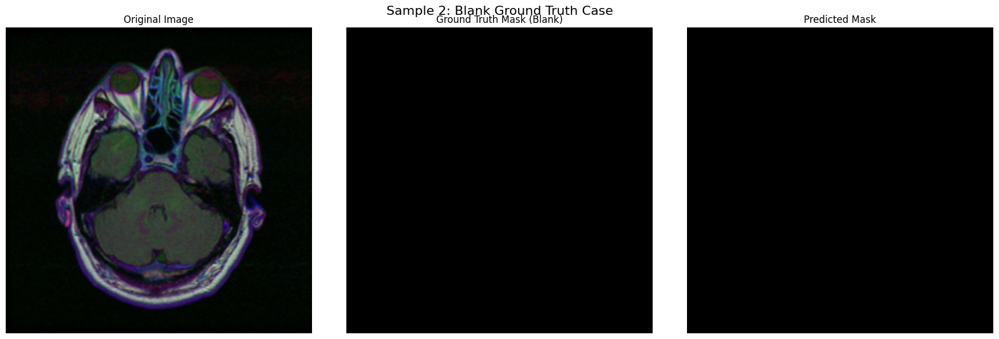


---> Found blank ground truth mask for test sample index: 3 (2/50)


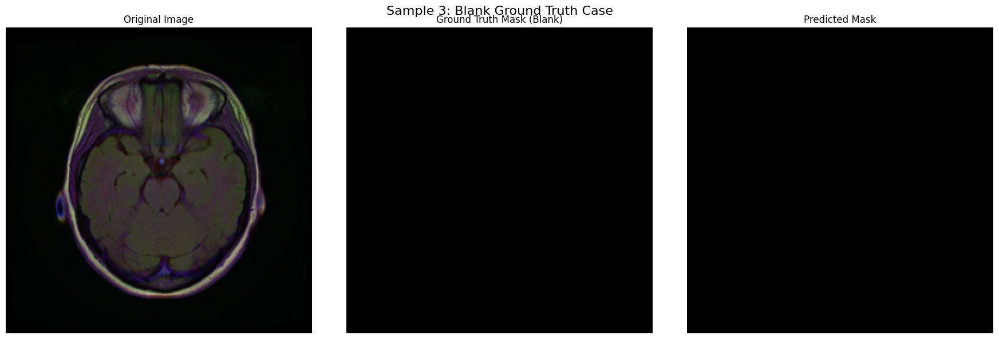


---> Found blank ground truth mask for test sample index: 4 (3/50)


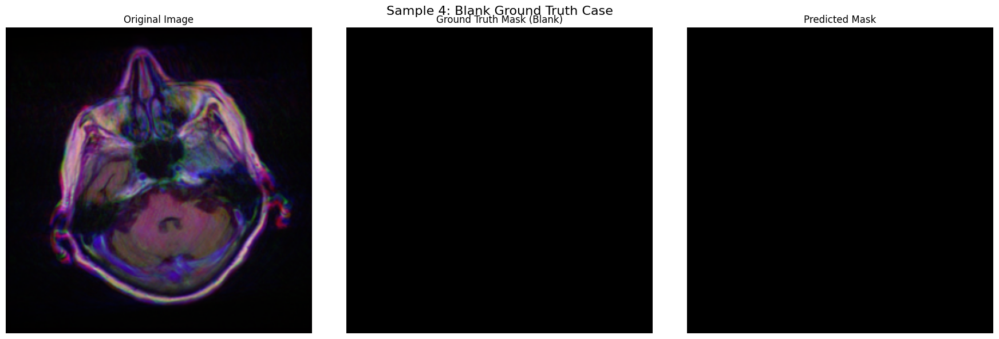


---> Found blank ground truth mask for test sample index: 6 (4/50)


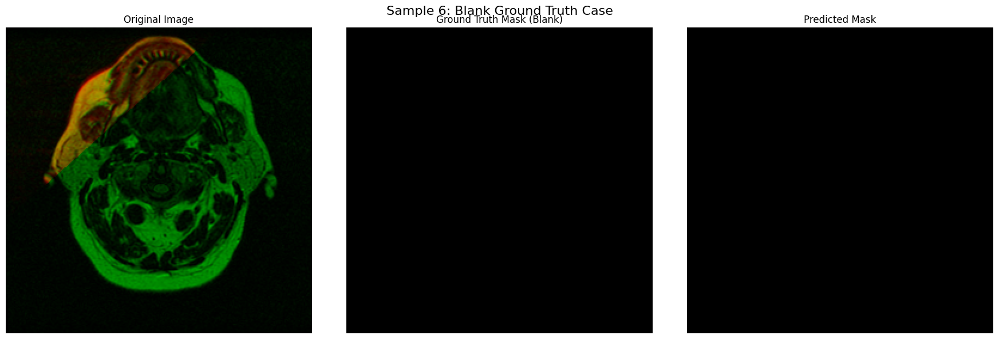


---> Found blank ground truth mask for test sample index: 7 (5/50)


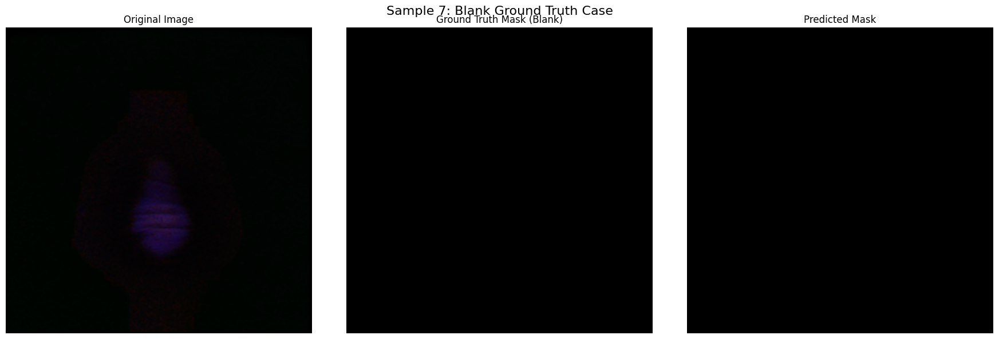


---> Found blank ground truth mask for test sample index: 11 (6/50)


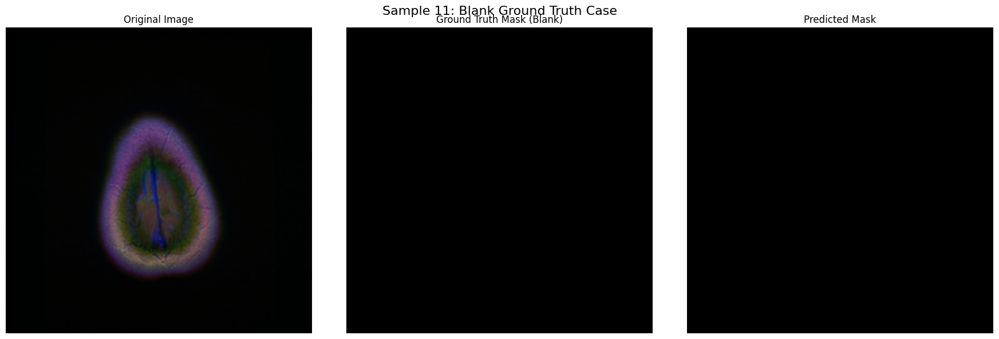


---> Found blank ground truth mask for test sample index: 13 (7/50)


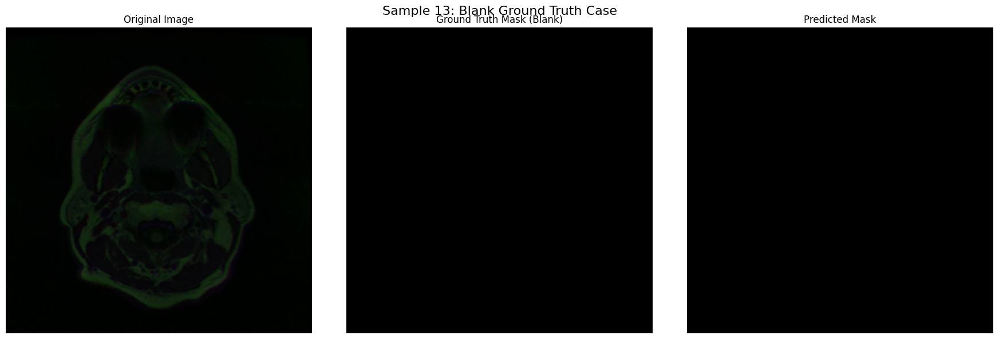


---> Found blank ground truth mask for test sample index: 14 (8/50)


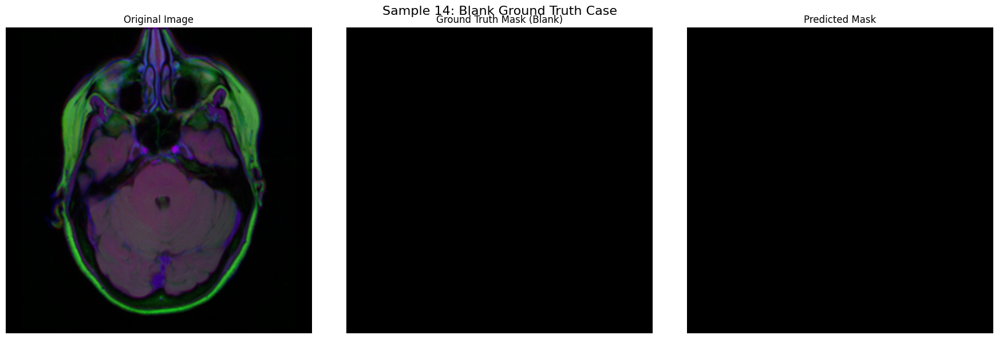


---> Found blank ground truth mask for test sample index: 16 (9/50)


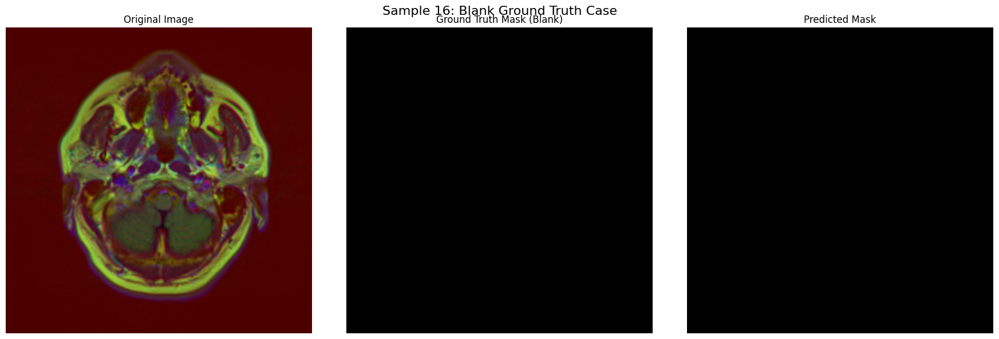


---> Found blank ground truth mask for test sample index: 17 (10/50)


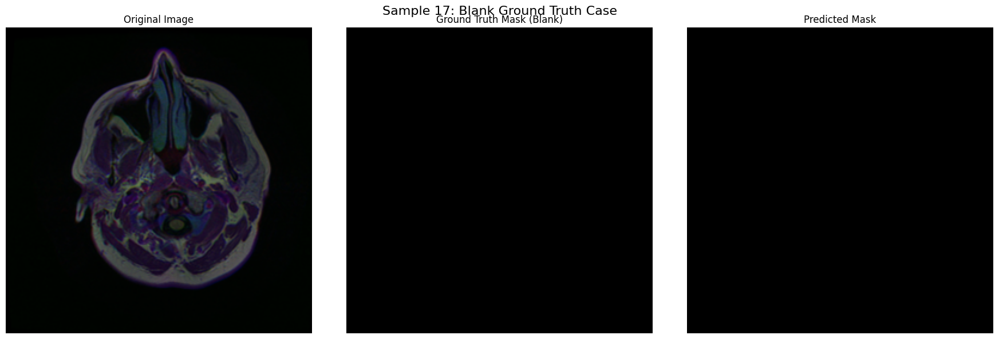


---> Found blank ground truth mask for test sample index: 18 (11/50)


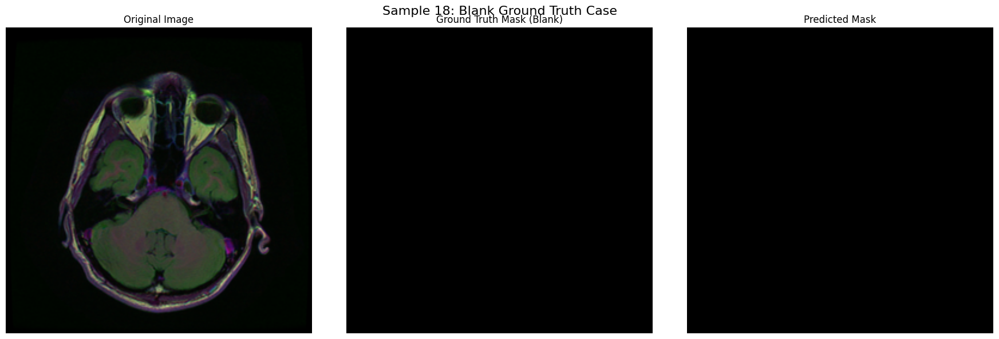


---> Found blank ground truth mask for test sample index: 20 (12/50)


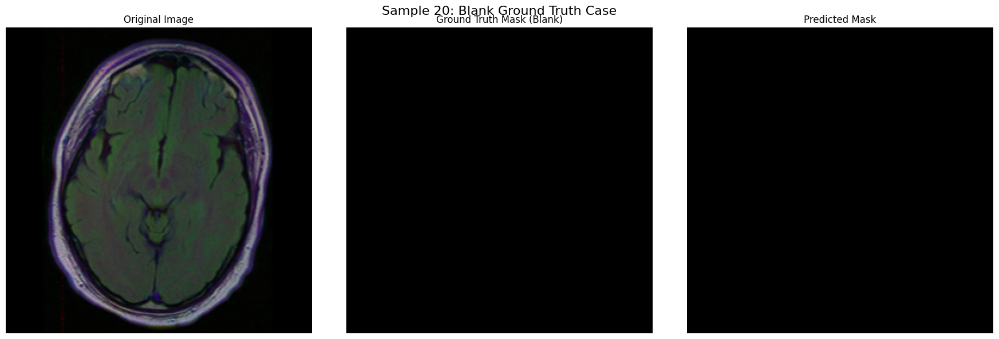


---> Found blank ground truth mask for test sample index: 22 (13/50)


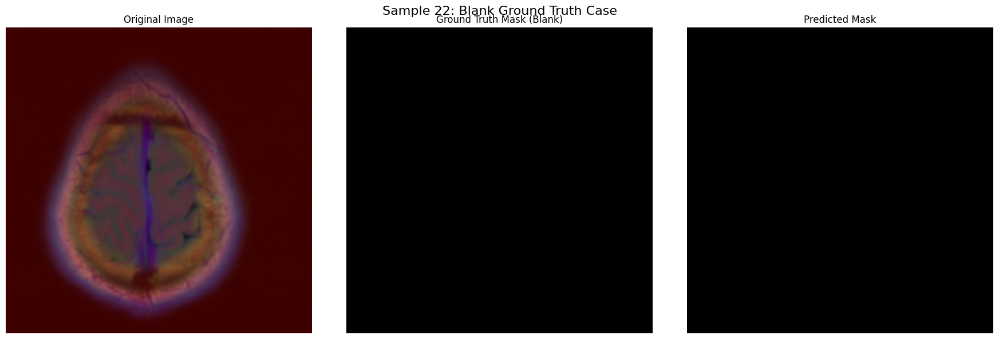


---> Found blank ground truth mask for test sample index: 25 (14/50)


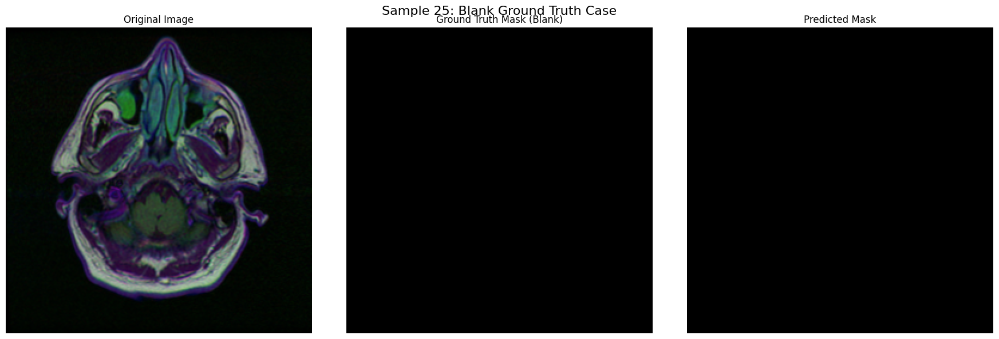


---> Found blank ground truth mask for test sample index: 26 (15/50)


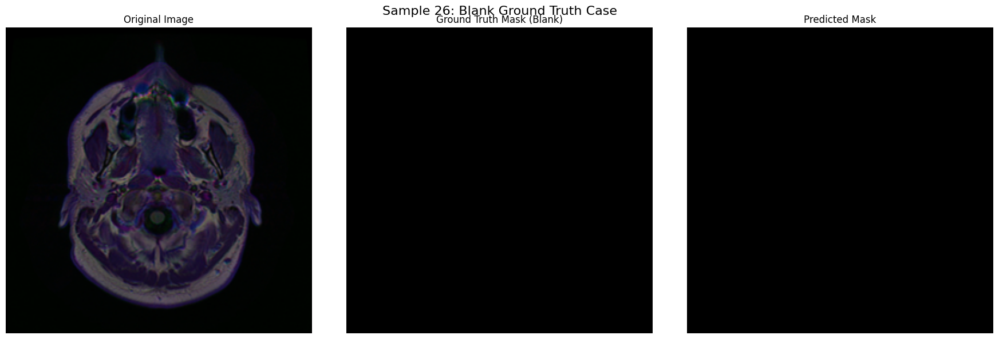


---> Found blank ground truth mask for test sample index: 27 (16/50)


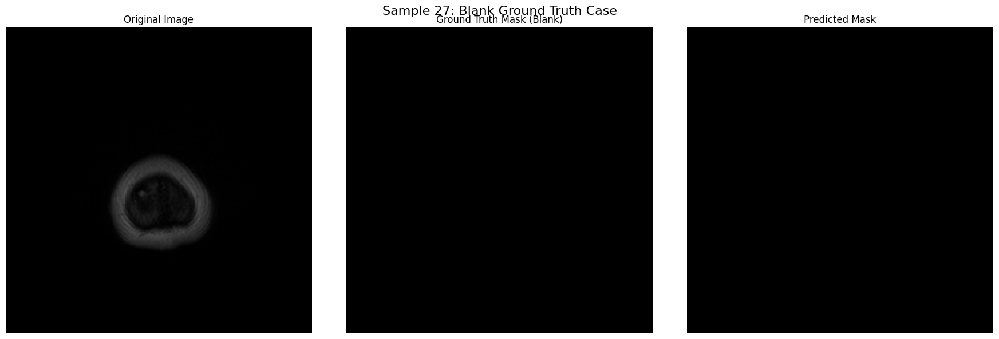


---> Found blank ground truth mask for test sample index: 29 (17/50)


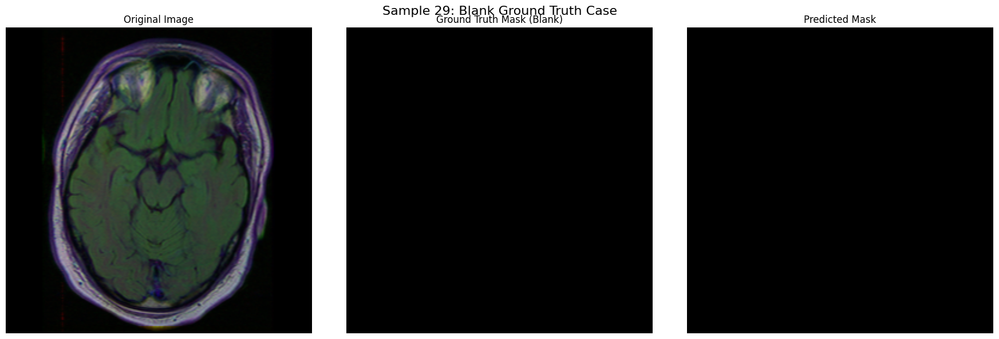


---> Found blank ground truth mask for test sample index: 30 (18/50)


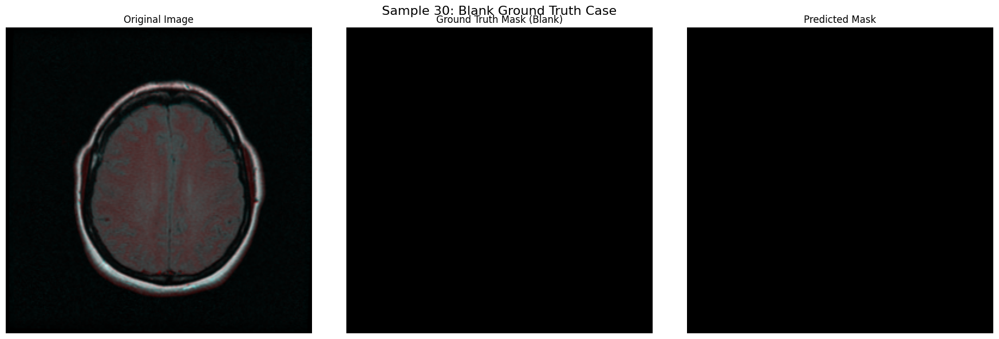


---> Found blank ground truth mask for test sample index: 31 (19/50)


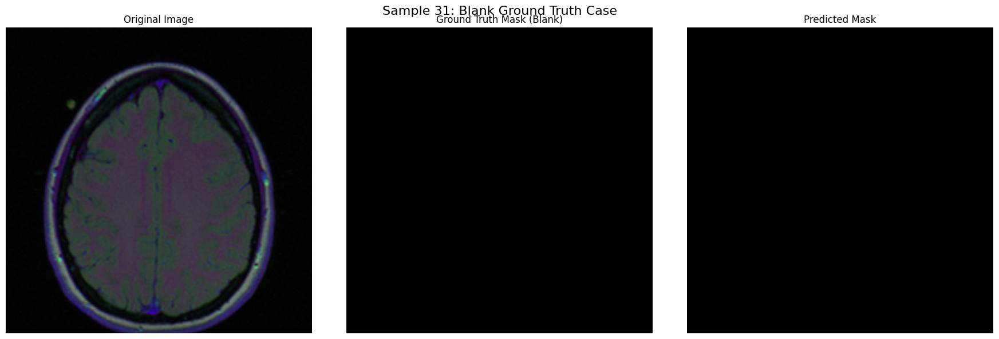


---> Found blank ground truth mask for test sample index: 32 (20/50)


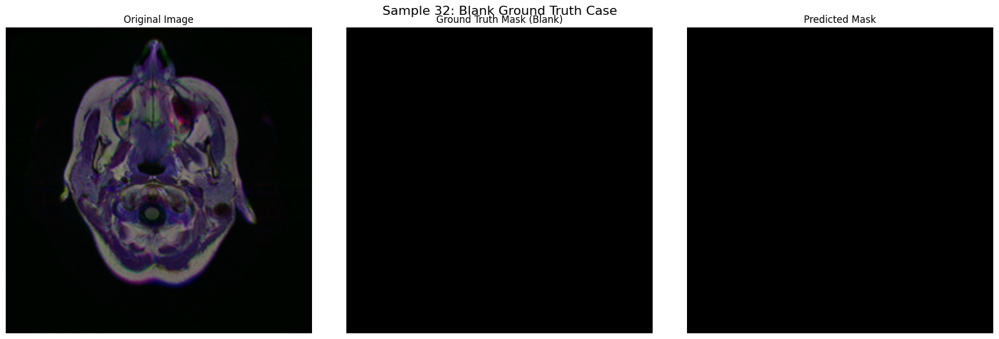


---> Found blank ground truth mask for test sample index: 33 (21/50)


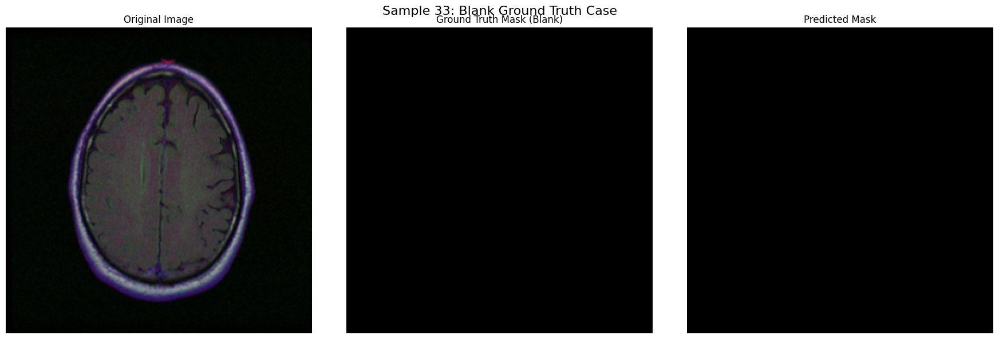


---> Found blank ground truth mask for test sample index: 35 (22/50)


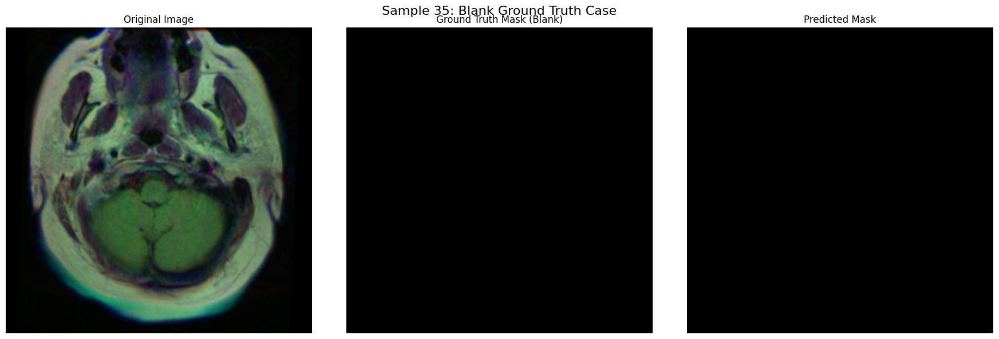


---> Found blank ground truth mask for test sample index: 36 (23/50)


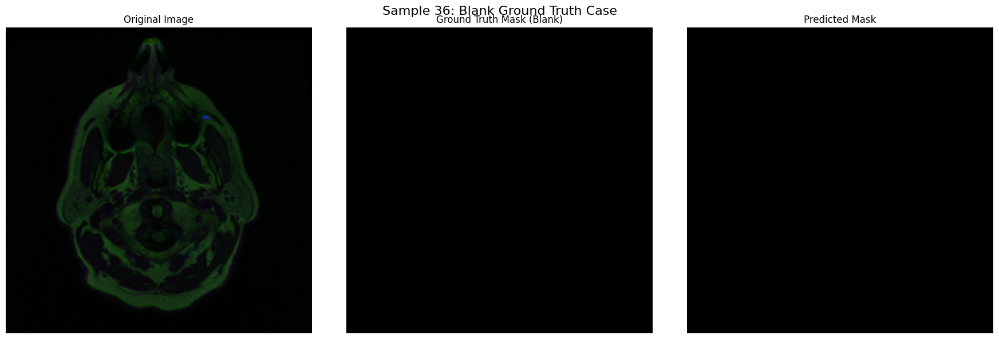


---> Found blank ground truth mask for test sample index: 38 (24/50)


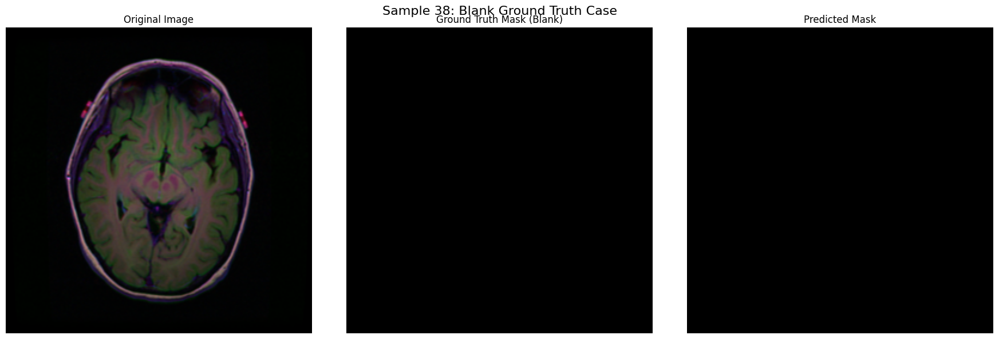


---> Found blank ground truth mask for test sample index: 40 (25/50)


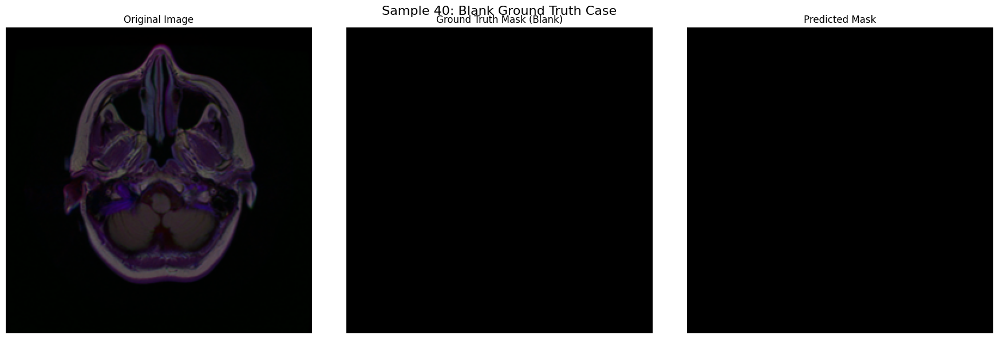


---> Found blank ground truth mask for test sample index: 41 (26/50)


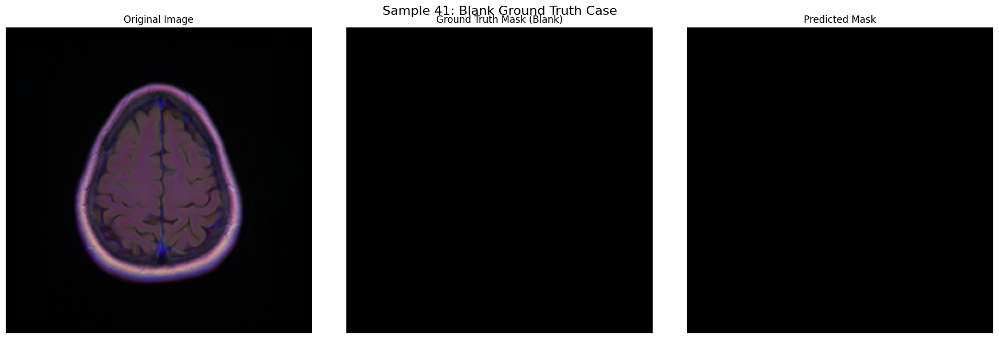


---> Found blank ground truth mask for test sample index: 44 (27/50)


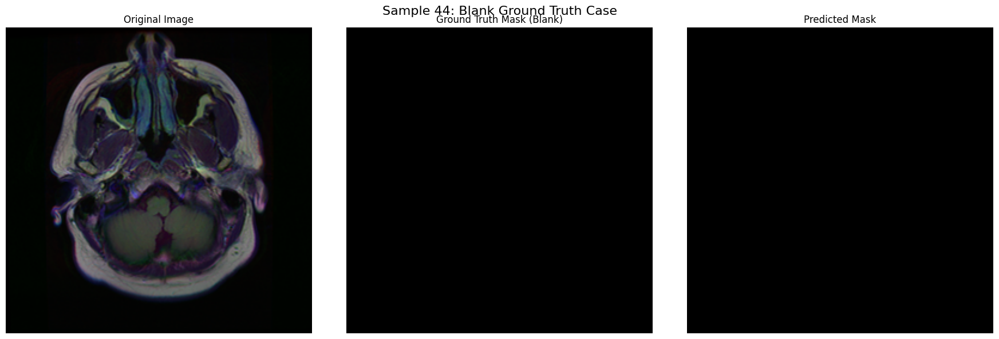


---> Found blank ground truth mask for test sample index: 45 (28/50)


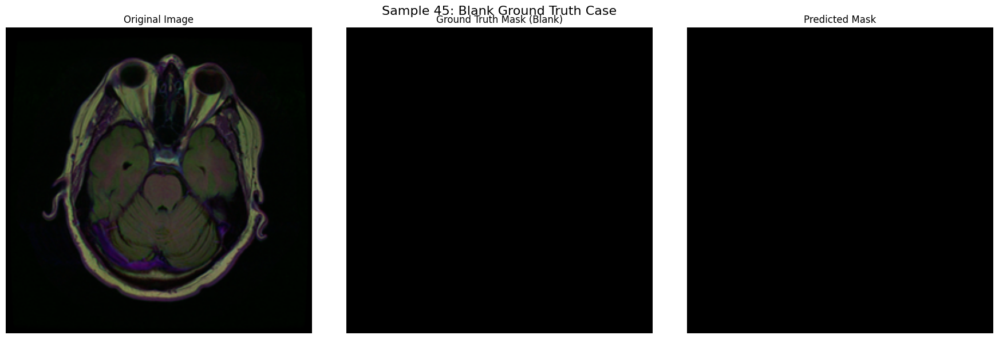


---> Found blank ground truth mask for test sample index: 47 (29/50)


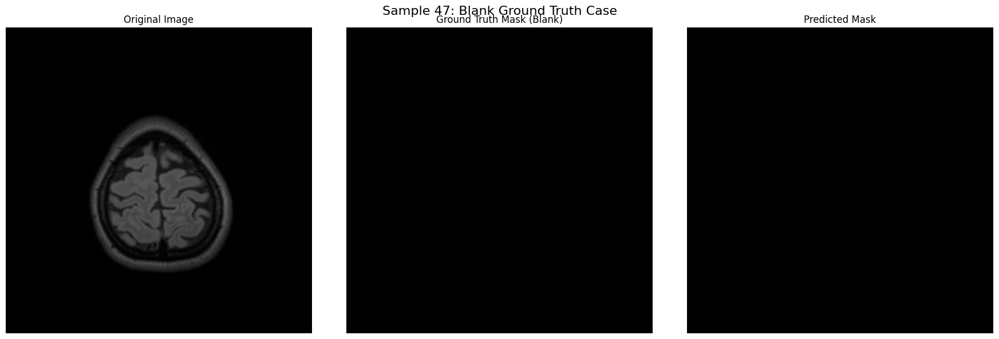


---> Found blank ground truth mask for test sample index: 48 (30/50)


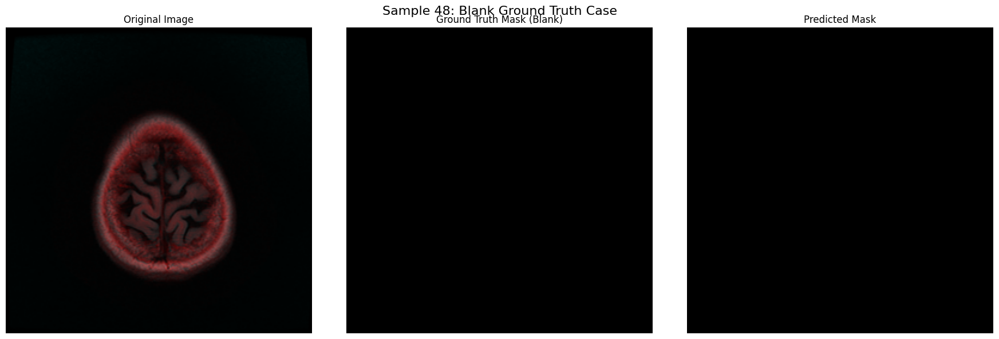


---> Found blank ground truth mask for test sample index: 49 (31/50)


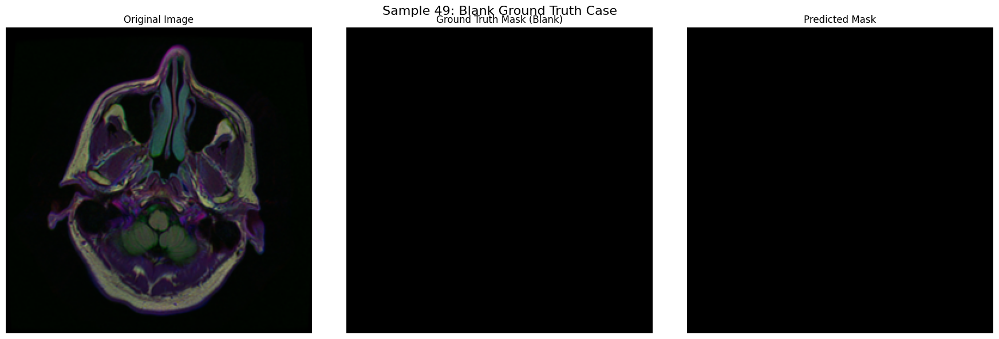


---> Found blank ground truth mask for test sample index: 53 (32/50)


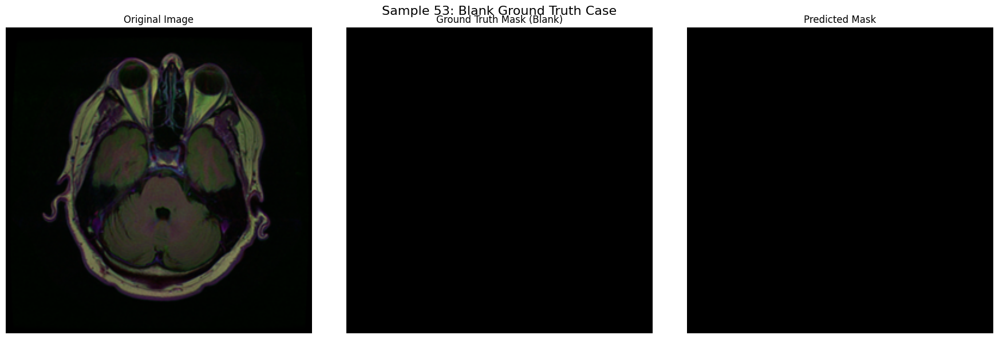


---> Found blank ground truth mask for test sample index: 54 (33/50)


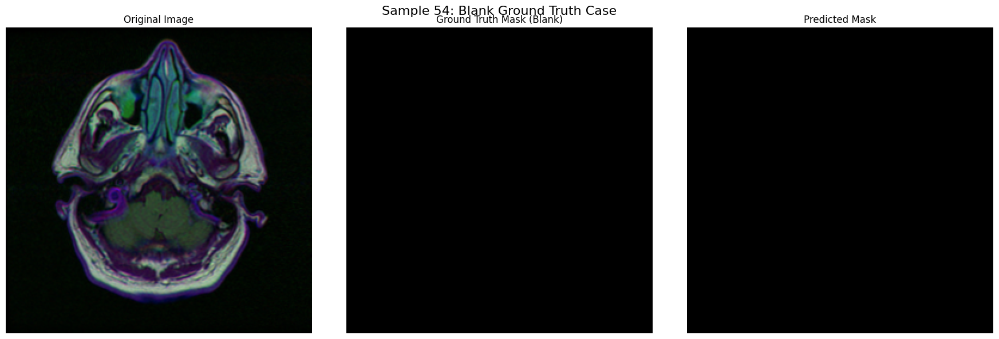


---> Found blank ground truth mask for test sample index: 55 (34/50)


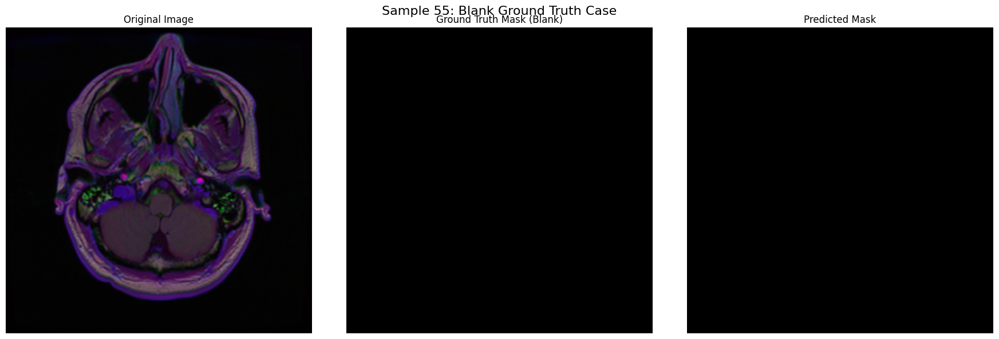


---> Found blank ground truth mask for test sample index: 56 (35/50)


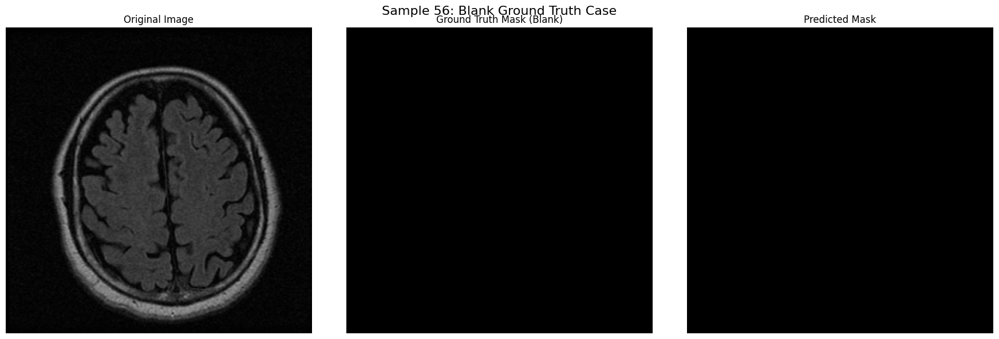


---> Found blank ground truth mask for test sample index: 59 (36/50)


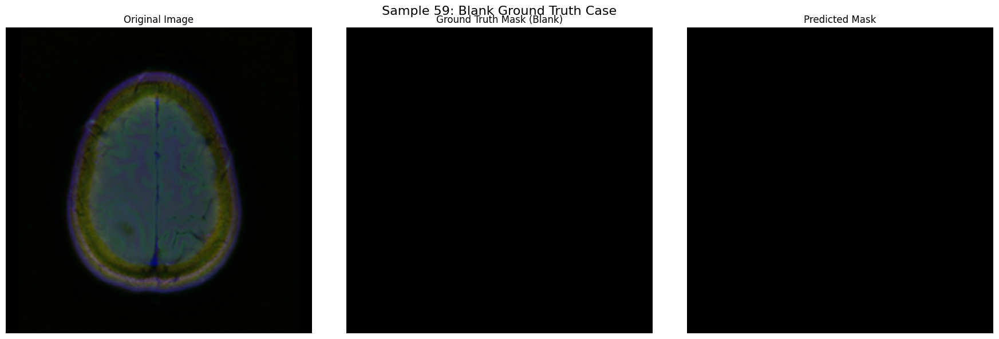


---> Found blank ground truth mask for test sample index: 60 (37/50)


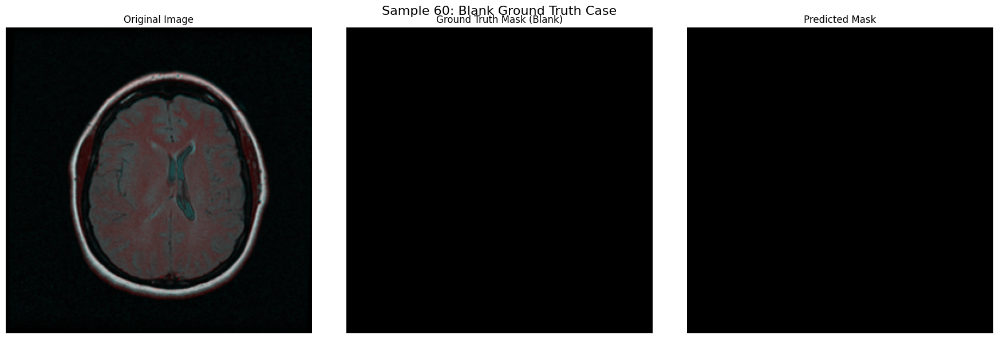


---> Found blank ground truth mask for test sample index: 61 (38/50)


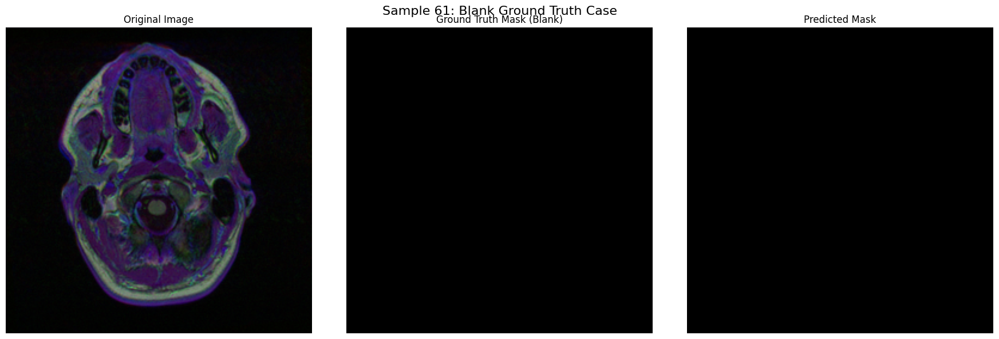


---> Found blank ground truth mask for test sample index: 62 (39/50)


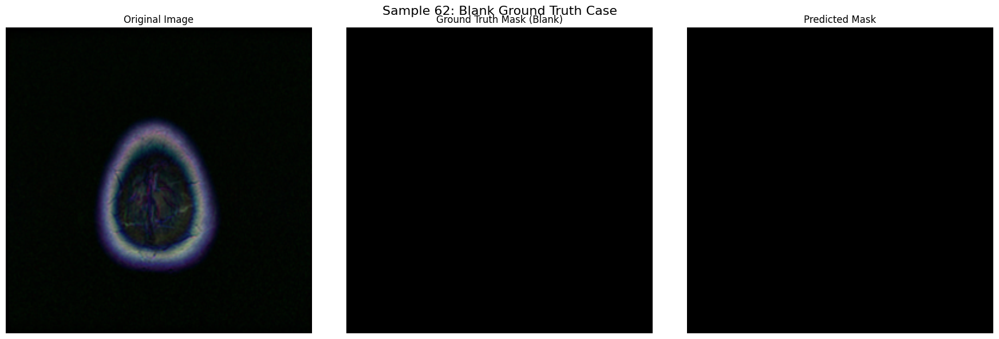


---> Found blank ground truth mask for test sample index: 63 (40/50)


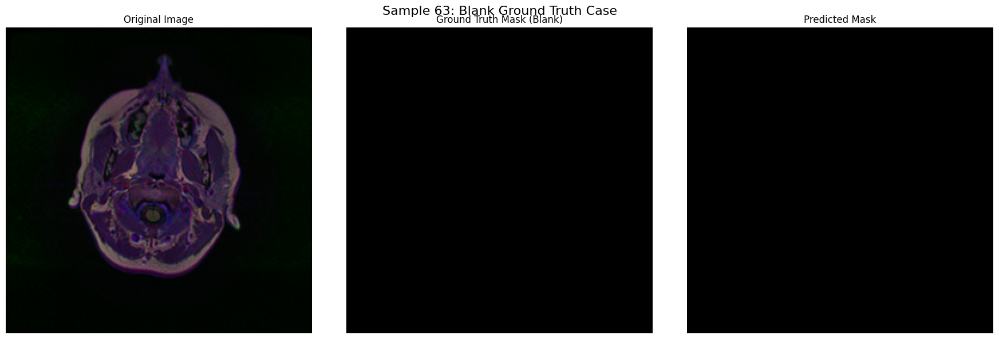


---> Found blank ground truth mask for test sample index: 64 (41/50)


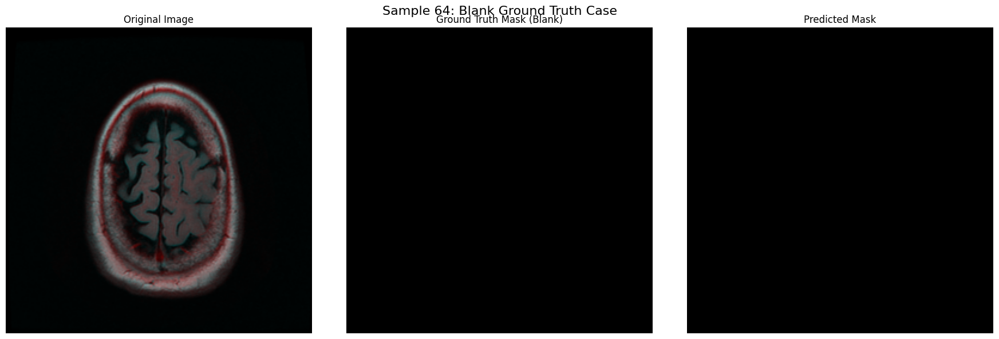


---> Found blank ground truth mask for test sample index: 66 (42/50)


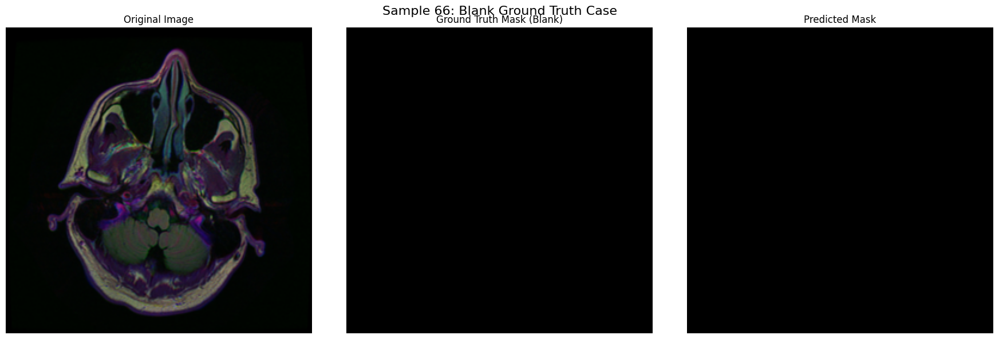


---> Found blank ground truth mask for test sample index: 67 (43/50)


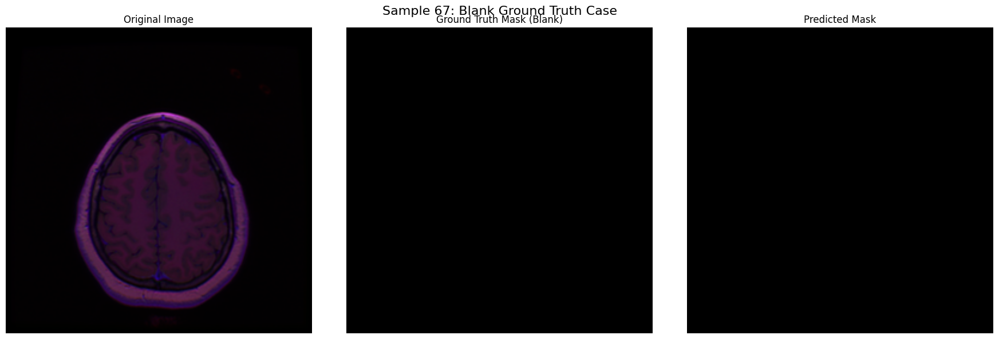


---> Found blank ground truth mask for test sample index: 68 (44/50)


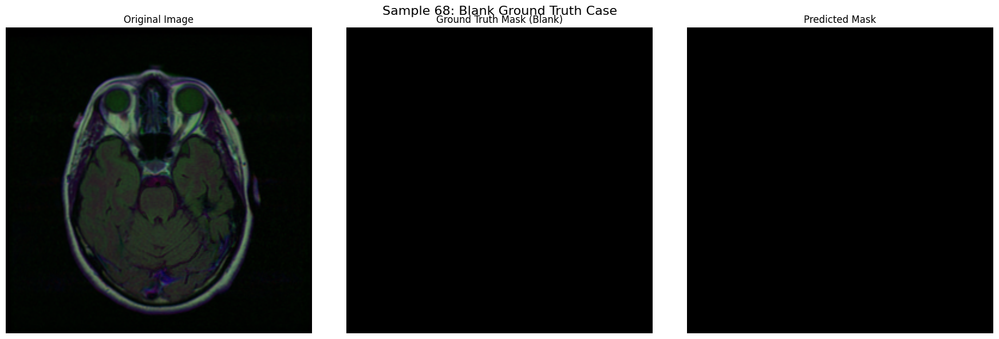


---> Found blank ground truth mask for test sample index: 70 (45/50)


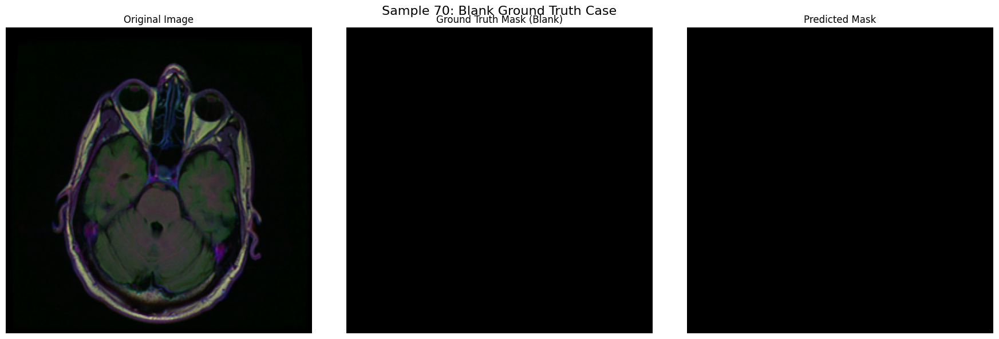


---> Found blank ground truth mask for test sample index: 72 (46/50)


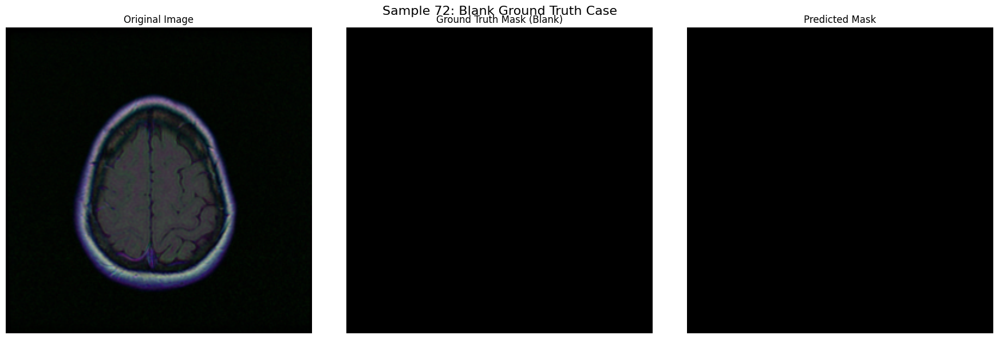


---> Found blank ground truth mask for test sample index: 73 (47/50)


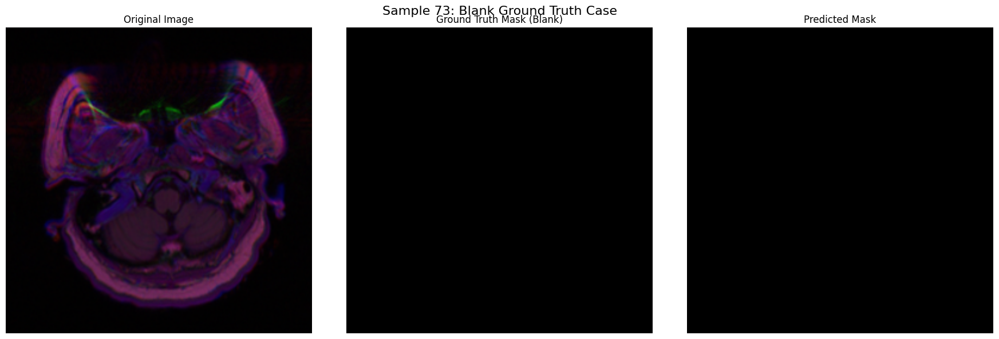


---> Found blank ground truth mask for test sample index: 75 (48/50)


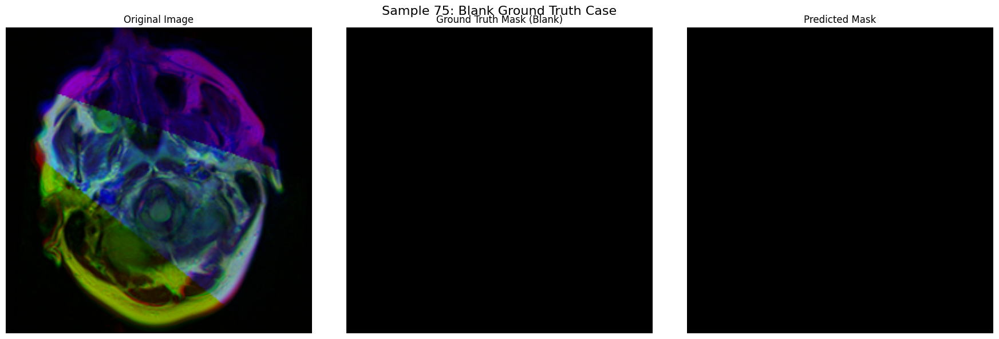


---> Found blank ground truth mask for test sample index: 76 (49/50)


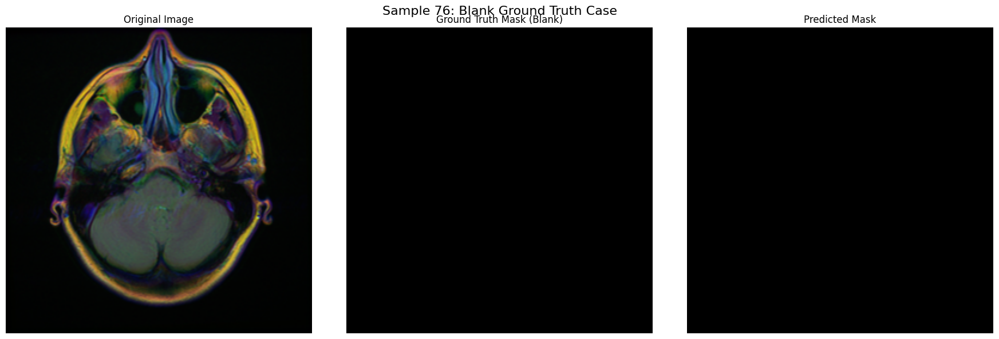


---> Found blank ground truth mask for test sample index: 77 (50/50)


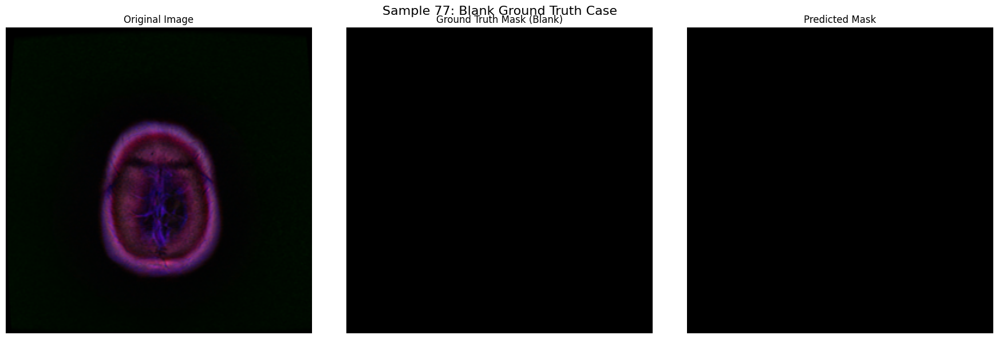


Output limit of 50 images reached. Stopping visualization.

Visualization complete.


In [ ]:
import os
import glob
import math
import random
import warnings
from typing import List, Tuple

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from PIL import Image
import torchvision.transforms as transforms
import cv2
import matplotlib.pyplot as plt

# Import necessary components for the model
import segmentation_models_pytorch as smp
from peft import PeftModel
from transformers import (
    AutoProcessor,
    LlavaForConditionalGeneration,
)

warnings.filterwarnings("ignore")
os.environ.setdefault("TOKENIZERS_PARALLELISM", "false")


class LlavaWithSegmentationHead(nn.Module):

    def __init__(self, llava_model):
        super().__init__()
        self.llava = llava_model
        self.vision_tower = self.llava.vision_tower


        self.seg_model = smp.DeepLabV3Plus(
            encoder_name="resnet34", encoder_weights=None, in_channels=3, classes=1,
        )
        smp_encoder_channels = self.seg_model.encoder.out_channels
        self.projection = nn.ModuleList([
            nn.Conv2d(1024, smp_encoder_channels[i], kernel_size=1) for i in range(1, 6)
        ])

    def forward(self, input_ids, pixel_values, attention_mask, labels=None, **kwargs):

        image_features = self.vision_tower(pixel_values, output_hidden_states=True)
        image_features_grid_with_cls = image_features.hidden_states[-1]


        image_features_grid = image_features_grid_with_cls[:, 1:, :]
        batch_size, num_patches, hidden_size = image_features_grid.shape
        patch_grid_size = int(math.sqrt(num_patches))
        seg_features = image_features_grid.reshape(
            batch_size, patch_grid_size, patch_grid_size, hidden_size
        ).permute(0, 3, 1, 2).contiguous()

        projected_features = [proj(seg_features) for proj in self.projection]
        scaled_projected_features = list(projected_features)
        scaled_projected_features[1] = F.interpolate(
            scaled_projected_features[1], scale_factor=4, mode='bilinear', align_corners=False
        )
        decoder_features = [None] + scaled_projected_features
        decoder_output = self.seg_model.decoder(decoder_features)
        seg_logits = self.seg_model.segmentation_head(decoder_output)
        seg_logits = F.interpolate(seg_logits, size=(336, 336), mode='bilinear', align_corners=False)


        vqa_output = self.llava(
            input_ids=input_ids, pixel_values=pixel_values,
            attention_mask=attention_mask, labels=labels, return_dict=True
        )

        return {
            "vqa_loss": vqa_output.loss,
            "vqa_logits": vqa_output.logits,
            "seg_logits": seg_logits.squeeze(1)
        }


class VLM_QASegDataset(Dataset):


    def __init__(self, image_paths: List[str], metadata_df: pd.DataFrame):
        self.image_paths: List[str] = []
        self.mask_paths: List[str] = []
        self.questions: List[str] = []
        self.answers: List[str] = []

        self.image_transform = transforms.Compose([transforms.Resize((336, 336))])
        self.mask_transform = transforms.Compose([
            transforms.Resize((336, 336), interpolation=transforms.InterpolationMode.NEAREST),
            transforms.ToTensor()
        ])

        mdx = metadata_df.set_index("Patient")
        for img_path in image_paths:
            mask_path = img_path.replace(".tif", "_mask.tif")
            if not os.path.exists(mask_path):
                continue

            pid_folder = os.path.basename(os.path.dirname(img_path))
            pid_key = "_".join(pid_folder.split("_")[0:3])
            if pid_key in mdx.index:
                row = mdx.loc[[pid_key]].iloc[0]
                grade = row.get("neoplasm_histologic_grade")
                if pd.notna(grade) and int(grade) in [1, 2]:
                    self.image_paths.append(img_path)
                    self.mask_paths.append(mask_path)

                    self.questions.append("N/A")
                    self.answers.append("N/A")

    def __len__(self) -> int:
        return len(self.image_paths)

    def __getitem__(self, idx: int):
        image = Image.open(self.image_paths[idx]).convert("RGB")
        mask = Image.open(self.mask_paths[idx]).convert("L")


        image_transformed = self.image_transform(image)
        mask_tensor = self.mask_transform(mask)
        mask_tensor = (mask_tensor > 0).float()


        return image, mask_tensor, self.questions[idx], self.answers[idx]


def vlm_collate_fn_for_evaluation(batch):
    images, masks, questions, answers = zip(*batch)
    masks_tensor = torch.stack(masks)

    return list(images), masks_tensor, list(questions), list(answers)


if __name__ == "__main__":
    config = {
        "device": "cuda:0" if torch.cuda.is_available() else "cpu",
        "base_path": "/home/ealam/Downloads/LGG dataset Cameron/lgg-mri-segmentation/kaggle_3m",
        "local_llava_path": "/home/ealam/Desktop/llava-1.5-7b-local",
        "saved_model_path": "./llava-lora-multitask-delineated-dwa-tp-modified",
        "csv_path": "/home/ealam/Downloads/LGG dataset Cameron/lgg-mri-segmentation/kaggle_3m/data.csv",
        "batch_size": 4,
        "num_workers": 4,
        "seed": 42,
    }
    DEVICE = config["device"]
    print(f"Using device: {DEVICE}")


    print("Step 1: Loading fine-tuned model from disk...")
    save_path = config["saved_model_path"]


    base_model = LlavaForConditionalGeneration.from_pretrained(
        config["local_llava_path"], torch_dtype=torch.float16
    )

    peft_model = PeftModel.from_pretrained(base_model, os.path.join(save_path, "llava_lora"))


    model = LlavaWithSegmentationHead(peft_model).to(DEVICE)
    model.eval()


    model.seg_model.load_state_dict(torch.load(os.path.join(save_path, "seg_model.pth"), map_location=DEVICE))
    model.projection.load_state_dict(torch.load(os.path.join(save_path, "projection.pth"), map_location=DEVICE))


    model.half()


    processor = AutoProcessor.from_pretrained(os.path.join(save_path, "processor"))
    print("Model loaded successfully.")


    print("\nStep 2: Preparing the test dataset...")
    all_image_paths = [p.replace("_mask.tif", ".tif") for p in glob.glob(os.path.join(config["base_path"], "*", "*_mask.tif"))]
    usable_paths, _ = train_test_split(all_image_paths, test_size=0.01, random_state=config["seed"])
    train_val_paths, test_paths = train_test_split(usable_paths, test_size=0.20, random_state=config["seed"])
    print(f"Found {len(test_paths)} samples in the test set.")

    metadata_df = pd.read_csv(config["csv_path"])
    test_ds = VLM_QASegDataset(test_paths, metadata_df)
    test_loader = DataLoader(
        test_ds,
        batch_size=config["batch_size"],
        shuffle=False,
        num_workers=config["num_workers"],
        collate_fn=vlm_collate_fn_for_evaluation
    )


    print("\nStep 3: Running inference to find and visualize blank ground truth cases...")
    found_blank_gt = False
    images_shown_count = 0
    output_limit = 50

    with torch.no_grad():
        print("Evaluating Test Set...")
        for i, batch in enumerate(test_loader):

            pil_images, gt_masks, _, _ = batch


            inputs = processor(
                text=["<image>" for _ in pil_images],
                images=pil_images,
                return_tensors="pt",
                padding=True
            ).to(DEVICE)


            outputs = model(**inputs)
            seg_logits = outputs["seg_logits"]


            pred_masks = (torch.sigmoid(seg_logits) > 0.5).cpu()


            for j in range(len(pil_images)):
                if gt_masks[j].sum() == 0:
                    if images_shown_count >= output_limit:
                        break

                    found_blank_gt = True
                    images_shown_count += 1
                    sample_idx = i * config['batch_size'] + j
                    print(f"\n---> Found blank ground truth mask for test sample index: {sample_idx} ({images_shown_count}/{output_limit})")


                    original_image = pil_images[j]
                    ground_truth_mask = gt_masks[j].squeeze().numpy()
                    predicted_mask = pred_masks[j].squeeze().numpy()


                    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
                    fig.suptitle(f"Sample {sample_idx}: Blank Ground Truth Case", fontsize=16)

                    axes[0].imshow(original_image)
                    axes[0].set_title("Original Image")
                    axes[0].axis('off')

                    axes[1].imshow(ground_truth_mask, cmap='gray')
                    axes[1].set_title("Ground Truth Mask (Blank)")
                    axes[1].axis('off')

                    axes[2].imshow(predicted_mask, cmap='gray')
                    axes[2].set_title("Predicted Mask")
                    axes[2].axis('off')

                    plt.tight_layout()
                    plt.show()

            if images_shown_count >= output_limit:
                print(f"\nOutput limit of {output_limit} images reached. Stopping visualization.")
                break

    if not found_blank_gt:
        print("\nNo blank ground truth masks were found ")
    print("\nVisualization complete.")



